# Étape 1 - Exploration des données & DataViz’

### Importation des libraires nécessaires

In [1]:
# Importation des bibliothèques nécessaires

import os                                               # Pour interagir avec le système de fichiers, par exemple, accéder aux chemins des fichiers et dossiers
from pathlib import Path                                # Pour manipuler les chemins de fichiers et de répertoires de manière flexible et indépendante du système d'exploitation
import pandas as pd                                     # Pour la manipulation et l'analyse des données en utilisant des DataFrames
import numpy as np                                      # Pour les opérations mathématiques et la manipulation des tableaux
import matplotlib.pyplot as plt                         # Pour créer des graphiques et visualiser des données
import seaborn as sns                                   # Pour créer des visualisations statistiques plus élaborées (basé sur matplotlib)
import cv2                                              # Pour la manipulation d'images, notamment pour des tâches telles que la lecture, l'écriture, et la transformation des images
from sklearn.model_selection import train_test_split    #Pour séparer les données de test et de train
from sklearn.ensemble import RandomForestClassifier     # Pour instancier et entraîner un modèle Random Forest
from sklearn.metrics import classification_report       # Rapport de classicification
from sklearn.metrics import accuracy_score              # Score de précision pour le random forest


## Fonctions TF/Keras pour l'architecture des modèles

from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.applications.efficientnet import EfficientNetB3
from tensorflow.keras.applications.mobilenet import MobileNet


from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.layers import Dense, Dropout, Flatten, GlobalAveragePooling2D, Conv2D,MaxPooling2D, Input
from tensorflow.keras.optimizers import Adam,Adamax
from tensorflow.keras.models import Model, Sequential, load_model
from tensorflow.keras.utils import load_img,img_to_array

from tensorflow import GradientTape, reduce_mean, squeeze,maximum,argmax,newaxis
from tensorflow.math import reduce_max



### Chargement du fichier et exploration des données

In [2]:
# Définir le répertoire de base du projet
project_dir = Path().resolve().parent
print(project_dir)

# Construire le chemin vers le fichier CSV
csv_path = project_dir / "data" / "dataframe_plant_disease_id.csv"

# Chargement du fichier 'dataframe_plant_disease_id.csv' dans un DataFrame df et visualisation des données
df = pd.read_csv(csv_path)
df.head()

C:\Users\Angel\Documents\GitHub\oct24_bds_reconnaissance_de_plantes\project-plantes-main


,chemin,hauteur,largeur,espèce,couleur,état
0,./semis/Cleavers/348.png,450,450,Cleavers,0.0,NaN
1,./semis/Cleavers/176.png,295,295,Cleavers,0.0,NaN
2,./semis/Cleavers/88.png,299,299,Cleavers,0.0,NaN
3,./semis/Cleavers/162.png,194,194,Cleavers,0.0,NaN
4,./semis/Cleavers/189.png,438,438,Cleavers,0.0,NaN


Description des différentes colonnes : 
- chemin : chemin de l'image dans les fichiers
- hauteur : hauteur de l'image en pixel
- largeur : largeur de l'image en pixel
- espèce : espèce de la plante
- couleur : booléen correspondant à 0 = image RGB et 1 = image segmented (sans fond)
- état : état de la plante. Prend soit : la valeur 'healthy' si la plante est saine, soit les valeurs correspondants aux noms de la maladie présente 'Black_rot', 'Early_blight', 'Target_Spot', 'Late_blight', 'Tomato_mosaic_virus', 'Haunglongbing_(Citrus_greening)', 'Leaf_Mold', 'Leaf_blight_(Isariopsis_Leaf_Spot)', 'Powdery_mildew', 'Cedar_apple_rust', 'Bacterial_spot', 'Common_rust_', 'Esca_(Black_Measles)', 'Tomato_Yellow_Leaf_Curl_Virus', 'Apple_scab', 'Northern_Leaf_Blight', 'Spider_mites Two-spotted_spider_mite', 'Septoria_leaf_spot', 'Cercospora_leaf_spot Gray_leaf_spot', 'Leaf_scorch'

### Inspection des données

In [ ]:
# Caractéristiques du DataFrame

print(df.info(), end="\n\n")

print(df.describe(), end="\n\n")

print("Taille du DataFrame", df.shape, end='\n\n')

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 59845 entries, 0 to 59844
Data columns (total 6 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   chemin   59845 non-null  object 
 1   hauteur  59845 non-null  int64  
 2   largeur  59845 non-null  int64  
 3   espèce   59845 non-null  object 
 4   couleur  59845 non-null  float64
 5   état     54306 non-null  object 
dtypes: float64(1), int64(2), object(3)
memory usage: 2.7+ MB
None

            hauteur       largeur       couleur
count  59845.000000  59845.000000  59845.000000
mean     265.191261    265.160097      0.907444
std       94.272690     93.551838      0.289811
min       49.000000     49.000000      0.000000
25%      256.000000    256.000000      1.000000
50%      256.000000    256.000000      1.000000
75%      256.000000    256.000000      1.000000
max     3652.000000   3457.000000      1.000000

Taille du DataFrame (59845, 6)



In [ ]:
# Vérification des duplicatats

print(df.duplicated(), end='\n\n')

longueur_initiale = len(df)

nb_lignes_dupliquees = df.duplicated().sum()

print("Nombre de lignes dupliquées:", nb_lignes_dupliquees)

0        False
1        False
2        False
3        False
4        False
         ...  
59840    False
59841    False
59842    False
59843    False
59844    False
Length: 59845, dtype: bool

Nombre de lignes dupliquées: 0


Nombre de valeurs manquantes par colonne :
 chemin        0
hauteur       0
largeur       0
espèce        0
couleur       0
état       5539
dtype: int64

Pourcentage de valeurs manquantes dans la colonne 'état' : 9.26 %


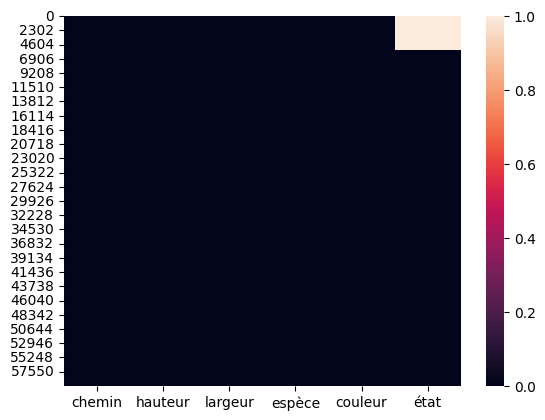

In [ ]:
# Vérification des valeurs manquantes
print("Nombre de valeurs manquantes par colonne :\n",df.isna().sum(), end='\n\n')
sns.heatmap(df.isna())

# Calculer le pourcentage de valeurs manquantes dans le DataFrame
valeurs_manquantes_etat = df['état'].isna().sum()
valeurs_manquantes_etat_pourcent = round(((valeurs_manquantes_etat / len(df)) * 100),2)
print("Pourcentage de valeurs manquantes dans la colonne 'état' :", valeurs_manquantes_etat_pourcent, "%")


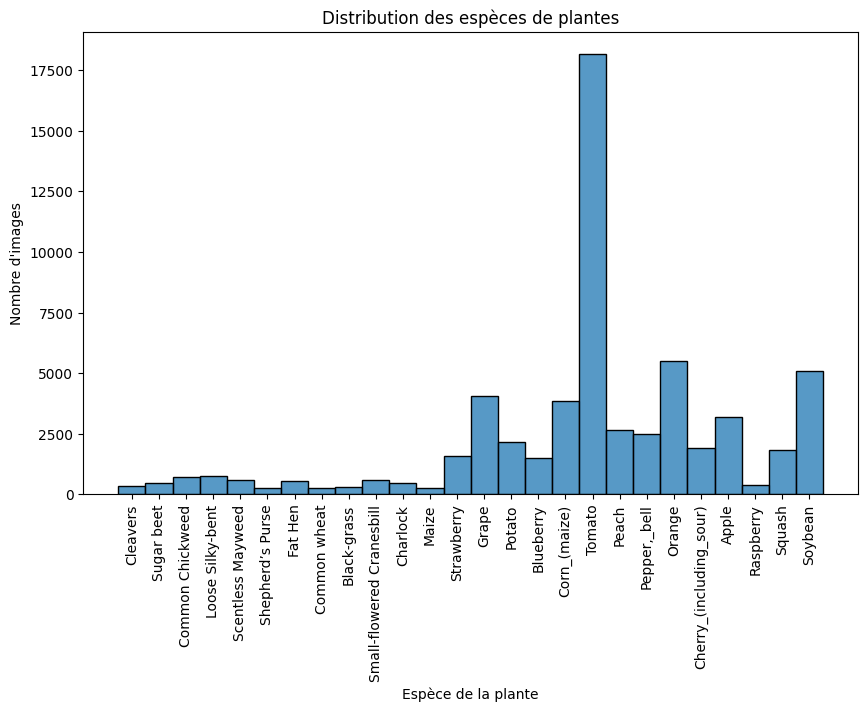

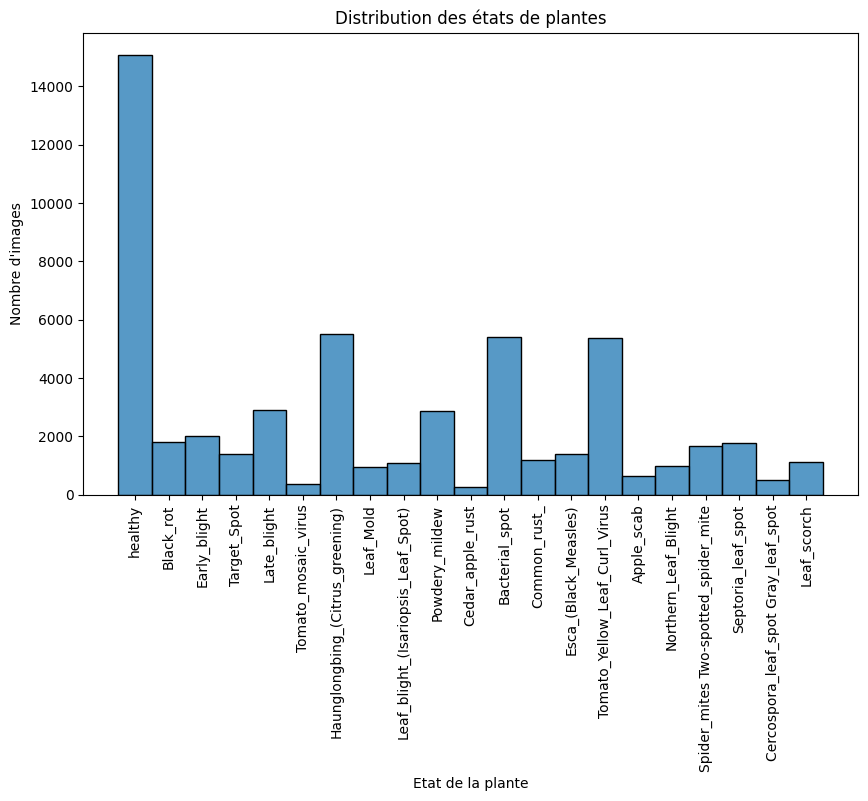

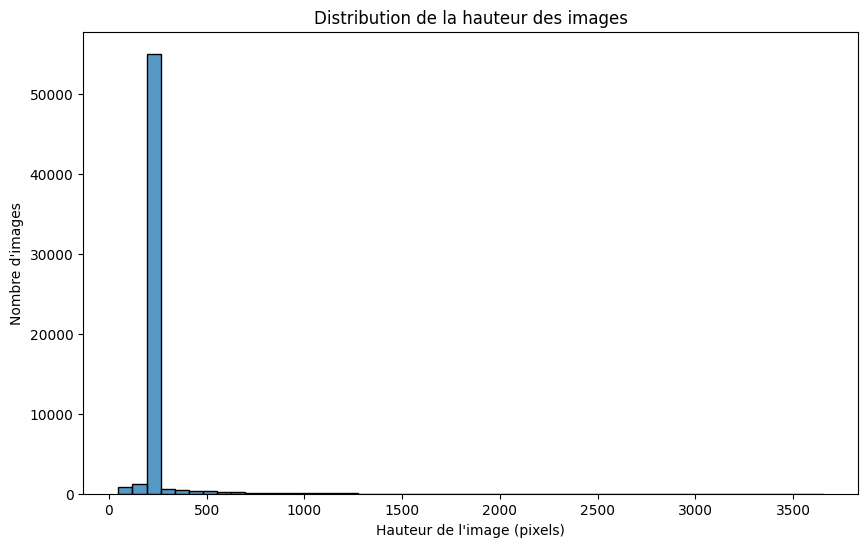

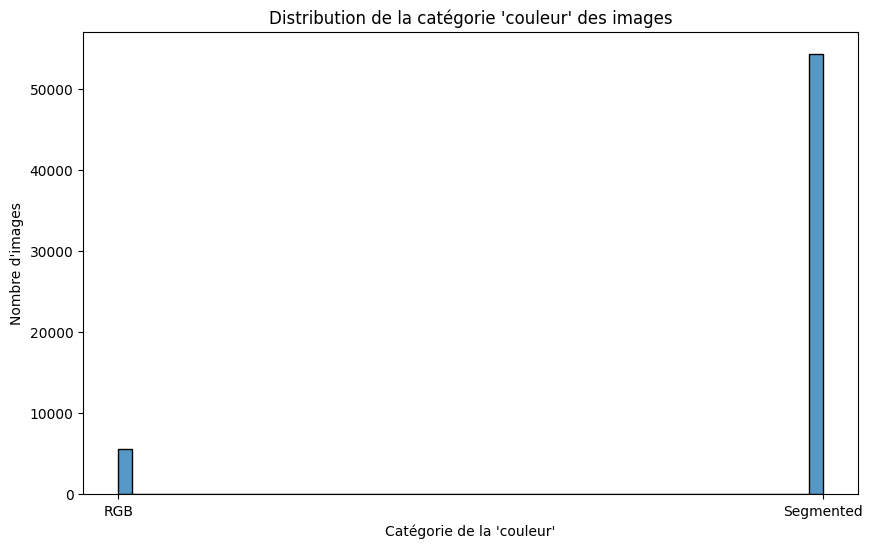

Pourcentage de plantes de type 'Tomato' : 30.35 %

Pourcentage de plantes dont l'état est 'healthy' : 25.21 %
Pourcentage de plantes dont l'état est 'unhealthy' : 65.54 %
Pourcentage de plantes dont l'état est 'NaN' : 9.26 %


In [ ]:
# Visualisation de la distribution des espèces de plantes au niveau du DataFrame

plt.figure(figsize=(10, 6))
sns.histplot(df['espèce'])
plt.title("Distribution des espèces de plantes")
plt.xlabel("Espèce de la plante")
plt.ylabel("Nombre d'images")
plt.xticks(rotation=90)
plt.show()

# Visualisation de la distribution des états de plantes au niveau du DataFrame

plt.figure(figsize=(10, 6))
sns.histplot(df['état'])
plt.title("Distribution des états de plantes")
plt.xlabel("Etat de la plante")
plt.ylabel("Nombre d'images")
plt.xticks(rotation=90)
plt.show()

# Visualisation de la distribution des hauteurs des images au niveau du DataFrame

plt.figure(figsize=(10, 6))
sns.histplot(df['hauteur'], bins=50)
plt.title("Distribution de la hauteur des images")
plt.xlabel("Hauteur de l'image (pixels)")
plt.ylabel("Nombre d'images")
plt.show()

# Visualisation de la distribution de la catégorie 'couleur' des images au niveau du DataFrame

plt.figure(figsize=(10, 6))
sns.histplot(df['couleur'], bins=50)
plt.title("Distribution de la catégorie 'couleur' des images")
plt.xlabel("Catégorie de la 'couleur'")
plt.xticks([0, 1], ['RGB', 'Segmented'])
plt.ylabel("Nombre d'images")
plt.show()


### Analyse des graphiques ###

# Calcul de la proportion représentant l'espèce 'Tomato' au niveau du DataFrame
valeurs_tomate = (df['espèce'] == 'Tomato').sum()
valeurs_tomate_pourcent = round((valeurs_tomate / len(df)) * 100, 2)
print("Pourcentage de plantes de type 'Tomato' :", valeurs_tomate_pourcent, "%\n")

# Calcul de la proportion représentant l'état 'healthy' au niveau du DataFrame
valeurs_healthy = (df['état'] == 'healthy').sum()
valeurs_healthy_pourcent = round((valeurs_healthy / len(df)) * 100, 2)
print("Pourcentage de plantes dont l'état est 'healthy' :", valeurs_healthy_pourcent, "%")

# Calcul de la proportion représentant l'état 'unhealthy' au niveau du DataFrame (différent de 'healthy' et NaN)
valeurs_unhealthy = ((df['état'] != 'healthy') & (~df['état'].isna())).sum()
valeurs_unhealthy_pourcent = round((valeurs_unhealthy / len(df)) * 100, 2)
print("Pourcentage de plantes dont l'état est 'unhealthy' :", valeurs_unhealthy_pourcent, "%")

# Calcul de la proportion représentant l'état 'NaN' au niveau du DataFrame
valeurs_nan = df['état'].isna().sum()
valeurs_nan_pourcent = round((valeurs_nan / len(df)) * 100, 2)
print("Pourcentage de plantes dont l'état est 'NaN' :", valeurs_nan_pourcent, "%")

Analyse des graphiques :
- Distribution des espèces de plantes :

Observation(s) : La catégorie "Tomato" est nettement surreprésentée (30.35%) par rapport aux autres espèces. Cela peut entraîner un déséquilibre dans notre modèle de classification, car il sera davantage biaisé vers cette catégorie.

Action(s) possible(s) : Application d'un sous-échantillonnage de "Tomato" pour équilibrer les données et pour réduire le biais dans le modèle de classification. L’application d’un suréchantillonnage serait plus complexe à mettre en œuvre, car il impliquerait de générer artificiellement des données pour de nombreuses classes sous-représentées, ce qui augmenterait la complexité et le risque de biais. En revanche, le sous-échantillonnage est ici une solution plus simple, puisqu’il ne concerne qu’une seule classe sur-représentée. Bien que cette méthode entraîne une perte d’information, cela reste acceptable compte tenu de la taille conséquente de notre échantillon d’images, qui garantit une diversité suffisante pour entraîner le modèle de manière efficace.

- Distribution des états des plantes :

Observation(s) : Environ 25,21 % des plantes sont dans l'état "healthy", tandis que 65,54 % sont atteintes de maladies et 9,26 % présentent des valeurs manquantes. Même si l'état "healthy" a une part importante, il y a une majorité d'exemples malades, ce qui est utile pour entraîner un modèle capable de détecter la présence de maladies sur les plantes. En ce qui concerne les valeurs manquantes, celles-ci restent significatives et pourraient avoir un impact sur la qualité des prédictions si elles ne sont pas traitées.

Action(s) possible(s) : Nous avons décidé d'utiliser le premier dataset uniquement pour l'entraînement des modèles de détection des espèces de plantes. Par conséquent, les valeurs manquantes n'auront aucun impact lors de l'entraînement des modèles pour la détection des maladies, puisque cette étape se concentrera exclusivement sur le second dataset.

- Distribution de la hauteur des images :

Observation(s) : La majorité des images ont une hauteur inférieure à 500 pixels, mais des valeurs extrêmes allant jusqu'à 3600 pixels sont présentes.

Action(s) possible(s) : Redimensionnement des images à une taille standard (par exemple 224x224) pour améliorer la cohérence des entrées.

- Distribution de la Catégorie "couleur" des images (RGB vs Segmented) :

Observation(s) : La majorité des images sont segmentées, tandis qu'une petite fraction est en format RGB (correspondante au DataSet V2 Plant Seedlings), ce qui pourrait affecter la classification.

Action(s) possible(s) : Conversion de toutes les images dans un même format segmenté (avec fond noir uni) pour améliorer la cohérence des entrées.

# Étape 2 - Pre-processing et feature engineering

Dans cette partie, nous allons appliquer différentes méthodes afin de répondre aux conclusions tirées précédemment :   
- Redimensionner les images à une taille standard pour faciliter l'entraînement des modèles.
- Convertir toutes les images au même format pour garantir la cohérence des entrées (application d'un masque vert pour supprimer le fond des images RGB).
- Combler les valeurs manquantes de la catégorie 'état'. Hypothèses : Le dataset des semis ne contient que des plantes saines. 
- Appliquer un sous-échantillonnage à la classe 'Tomato' pour équilibrer les classes.

In [ ]:
### Définition des fonctions ### 

# Fonction pour importer et convertir une image au format classique (0-255)
def import_image(image_path):
    """
    Importation d'image à partir d'un chemin
    Paramètres : 
        image_path (string) : chemin de l'image locale
    Return : 
        img (array): image importée
    """
    # Importation de l'image
    img = plt.imread(image_path)
    
    # Conversion du type png (0-1) en classique (0-255)
    if img.dtype == np.float32 or img.dtype == np.float64:
        img = (img * 255).astype(np.uint8)
    
    return img

# Fonction pour redimensionner une image à la taille standard 224x224
def resize_image(img, size=(224, 224)):
    """
    Redimensionnement d'image
    Paramètres : 
        img (array) : image 
    Return : 
        img_resized (array): image redimensionnée
    """
   
    img_resized = cv2.resize(img, size)

    return img_resized

# Fonction pour appliquer un masque vert et convertir les images RGB au format segmenter (fond noir)
def create_green_mask(img, green_threshold=(90, 10, 90)):
    """
    Application d'un masque vert pour extraire la plante du fond
    Paramètres : 
        img (array) : image 
        green_threshold (tuple) : seuil de couleur vert RGB
    Return : 
        green_mask (array) : image du masque vert
        masked_image (array) : image avec masque appliqué

    """
    
    # Isoler les pixels du filtre vert
    green_mask = (img[:,:,1] > img[:,:,0]) & (img[:,:,1] > img[:,:,2])
    
    # Seuil pour vert
    green_mask = green_mask & (img[:,:,1] > green_threshold[1])
    
    # Seuil pour rouge et jaune
    green_mask = green_mask & (img[:,:,0] < green_threshold[0]) & (img[:,:,2] < green_threshold[2])
    
    # Application du masque + négatif
    masked_img = img.copy()

    if img.shape[2] == 3 : 
        masked_img[~green_mask] = [0, 0, 0]

    elif img.shape[2] == 4 :
        masked_img[~green_mask] = [0, 0, 0, 255]
    
    return green_mask, masked_img

# Fonction pour sous-échantillonner la classe "Tomato" qui est sur-représentée
def downsample_majority_classe(df):
    """
    Fonction de sous-échantillonage
    Paramètres : 
        df (dataframe) : dataframe de nos images
    Return : 
        df_equilibre (dataframe): dataframe sous-échantillonné
    """
    from sklearn.utils import resample
    
    # Séparation de la classe majoritaire (Tomato) et des autres classes
    df_majority = df[df['espèce'] == 'Tomato']
    df_minority = df[df['espèce'] != 'Tomato']
    
    # Définition de la taille cible comme celle de la classe minoritaire la plus grande
    target_size = df_minority['espèce'].value_counts().max()
    
    # Sous-échantillonner la classe majoritaire
    df_majority_downsampled = resample(df_majority, 
                                       replace=False,           # Échantillonnage sans remise
                                       n_samples=target_size,   # Réduire à la taille cible
                                       random_state=42)         # Pour la reproductibilité
    
    # Fusion de la classe majoritaire sous-échantillonnée et des autres classes
    df_equilibre = pd.concat([df_majority_downsampled, df_minority])
    
    return df_equilibre

# Fonction pour afficher les résultats du process
def display_image_results(img_resized, green_mask, masked_img):
    """
    Affichage des résultats sous forme de subplot
    Paramètres : 
        img_resized (array) : image redimensionnée
        green_mask (array) : masque vert
        masked_img (array) : image redimensionnée avec masque vert appliqué 
        
    """
    fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(15, 5))
    ax1.imshow(img_resized)
    ax1.set_title('Image redimensionnée')
    ax2.imshow(green_mask, cmap='gray')
    ax2.set_title('Masque')
    ax3.imshow(masked_img)
    ax3.set_title('Image masquée')
    plt.tight_layout()
    plt.show()

# Fonction pour appliquer le process complet
def process_images(image_paths, size=(224, 224), green_threshold=(90, 10, 90), df=df):
    """
    Application du pré-processing
    Paramètres : 
        image_paths (list) : chemin des images à traiter
        size (tuple) : taille de l'image pour le redimensionnement
        green_threshold (tuple) : seuil de couleur verte pour le masque 
        df (dataframe) ; dataframe de nos images
    Return : 
        df (dataframe): dataframe actualisé de nos images pre-process
    """
    new_path = []

    espece = df.espèce.tolist()
    for i, image_path in enumerate(image_paths):
        print(f"Processing image {i+1}/{len(image_paths)}: {image_path}")
        
        # Étape 1: Importation de l'image
        img = import_image(image_path)
        
        # Étape 2: Redimensionnement de l'image
        img_resized = resize_image(img, size=size)

        # Mise à jour de la hauteur et largeur dans le DataFrame
        df.loc[df['chemin'] == image_path, 'hauteur'] = size[0]
        df.loc[df['chemin'] == image_path, 'largeur'] = size[1]

        
        # Étape 3: Application du masque vert et convertir les images RGB au format segmenter (fond noir)
        # Dans le cas du DataSet avec uniquement les semis https://www.kaggle.com/datasets/vbookshelf/v2-plant-seedlings-dataset, on applique le masque vert pour convertir les images RGB en segmented
        if 'semis' in image_path :
            green_mask, masked_img = create_green_mask(img_resized, green_threshold=green_threshold)
            
            # Mise à jour de la colonne 'couleur' pour l'image segmentée
            df.loc[df['chemin'] == image_path, 'couleur'] = 1
            
            # Sauvegarde des résultats
            #plt.imsave(f"{output_path}/image_{i+1}_resized.png", img_resized)
            #plt.imsave(f"{output_path}/image_{i+1}_mask.png", green_mask, cmap='gray')
            plt.imsave(f"{project_dir}/data_masked/semis/{espece[i]}/image_{i}_masked.png", masked_img)
            new_path.append(f"{project_dir}/data_masked/semis/{espece[i]}/image_{i}_masked.png")
        # Dans le cas du DataSet https://www.kaggle.com/datasets/abdallahalidev/plantvillage-dataset, les images sont déjà segmentées
        else : 
          # Sauvegarde des résultats
          plt.imsave(f"{project_dir}/data_masked/plantdisease/{espece[i]}/image_{i}_masked.png", img_resized)
          new_path.append(f"{project_dir}/data_masked/plantdisease/{espece[i]}/image_{i}_masked.png")


    df["chemin"] = new_path

    return df

In [5]:
### Application ###

# Appliquer le sous-échantillonnage pour équilibrer les classes
df_equilibre = downsample_majority_classe(df)



In [ ]:
# Appliquer le traitement des images

# Définition du dossier de sortie des images
output_dir = project_dir / "data" / "output_images_resample"

# Corrections des chemins dans df_equilibre pour pointer vers 'data' au lieu de './'
df_equilibre["chemin"] = df_equilibre["chemin"].apply(lambda x: str(project_dir / x.replace('./', 'data/')))

# Création de la liste des chemins d'images
image_paths = df_equilibre["chemin"].tolist()

# Identification d'une image noire dans le DataSet "PlantVillage" à supprimer avant traitement des images
image_to_remove = str(project_dir / 'data/plantdisease/Soybean___healthy/b32e4516-9cd7-4226-be52-26f413c97834___RS_HL 3512_final_masked.jpg')
image_paths.remove(image_to_remove)

df_equilibre = df_equilibre[df_equilibre['chemin'] != image_to_remove]
print(df_equilibre.head())

#Tri des images masquées dans des fichiers par espèces
class_names_semis = df[df['chemin'].str.contains('semis', case=False)].espèce.unique()
class_names_plant = df[df['chemin'].str.contains('plantdisease', case=False)].espèce.unique()

for classe in class_names_plant:
    (project_dir / 'data_masked' / 'plantdisease' / classe).mkdir(parents=True, exist_ok=True)

for classe in class_names_semis:
    (project_dir / 'data_masked' / 'semis' / classe).mkdir(parents=True, exist_ok=True)



                                                  chemin  hauteur  largeur  \
33373  /Users/clara/Desktop/project-plantes-main - ZI...      256      256   
33256  /Users/clara/Desktop/project-plantes-main - ZI...      256      256   
14388  /Users/clara/Desktop/project-plantes-main - ZI...      256      256   
38923  /Users/clara/Desktop/project-plantes-main - ZI...      256      256   
36079  /Users/clara/Desktop/project-plantes-main - ZI...      256      256   

       espèce  couleur                           état  
33373  Tomato      1.0                        healthy  
33256  Tomato      1.0                        healthy  
14388  Tomato      1.0                    Late_blight  
38923  Tomato      1.0  Tomato_Yellow_Leaf_Curl_Virus  
36079  Tomato      1.0  Tomato_Yellow_Leaf_Curl_Virus  


#### À décommenter pour appliquer le masque vert

In [ ]:
#df_equilibre_up = process_images(image_paths, output_path=output_dir, size=(224, 224), green_threshold=(90, 10, 90), df=df_equilibre)
#df_equilibre_up.to_csv(project_dir / 'data_masked' / 'dataframe_up_mask.csv')

#### Chargement du fichier .csv du dataframe actualisé

In [ ]:
## Chargement du fichier mis à jour avec les informations masquées
df_equilibre = pd.read_csv(project_dir / 'data_masked' / 'dataframe_up_mask.csv')


In [8]:
df_equilibre.head()

,Unnamed: 0,chemin,hauteur,largeur,espèce,couleur,état
0,33373,/Users/clara/Desktop/project-plantes-main - ZI...,224,224,Tomato,1.0,healthy
1,33256,/Users/clara/Desktop/project-plantes-main - ZI...,224,224,Tomato,1.0,healthy
2,14388,/Users/clara/Desktop/project-plantes-main - ZI...,224,224,Tomato,1.0,Late_blight
3,38923,/Users/clara/Desktop/project-plantes-main - ZI...,224,224,Tomato,1.0,Tomato_Yellow_Leaf_Curl_Virus
4,36079,/Users/clara/Desktop/project-plantes-main - ZI...,224,224,Tomato,1.0,Tomato_Yellow_Leaf_Curl_Virus


# Étape 3 - Modélisation

### Séparation des données à partir du dataframe

Séparation des données à partir du dataframe en un jeu d'entrainement (80%), de validation (10%) et de test (10%).   
Des générateurs d'images sont créés à partir des dataframes séparés.

In [ ]:
##Séparation des données à partir du dataframe 
## Entrainement
esp = df_equilibre['espèce']
train_df, rest_df = train_test_split(df_equilibre,  train_size= 0.8, shuffle= True, random_state= 42, stratify= esp)

# Validation et Test
esp = rest_df['espèce']
valid_df, test_df = train_test_split(rest_df,  train_size= 0.5, shuffle= True, random_state= 42, stratify= esp)

### Création des ImageDataGenerator de train, de validation et de test

In [ ]:
def image(img):
    """
    Fonction de preprocessing pour le générateur d'image
    Paramètres :
        img (array) : image
    Return : 
        img (array) : image
    """
    return img

In [ ]:
## définition du batch size
batch_size=40

## Création des générateurs d'images à partir de nos différents dataframes
tr_gen = ImageDataGenerator(preprocessing_function= image, horizontal_flip= True)
tst_gen = ImageDataGenerator(preprocessing_function= image)

train_gen = tr_gen.flow_from_dataframe(train_df, x_col= 'chemin', y_col= 'espèce', target_size= (224,224), class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

valid_gen = tst_gen.flow_from_dataframe( valid_df, x_col= 'chemin', y_col= 'espèce', target_size= (224,224), class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= True, batch_size= batch_size)

test_gen = tst_gen.flow_from_dataframe( test_df, x_col= 'chemin', y_col= 'espèce', target_size= (224,224), class_mode= 'categorical',
                                    color_mode= 'rgb', shuffle= False, batch_size= 80)

Found 37752 validated image filenames belonging to 26 classes.
Found 4719 validated image filenames belonging to 26 classes.
Found 4720 validated image filenames belonging to 26 classes.


## Baseline des modèles

## RandomForest

In [ ]:
def import_image_list(image_liste_path_fold):
    """
    Importation d'images à partir de chemins et stockage dans une liste
    Paramètres : 
        image_liste_path_fold (string) : chemin de l'image locale
    Return : 
        images_list (list): liste des images
    """
    images_list = []
    for i, image_path in enumerate(image_liste_path_fold):
        print(f"Processing image {i+1}/{len(image_liste_path_fold)}: {image_path}")
            
        # Étape 1: Importation de l'image
        img=cv2.imread(image_path,0)
        img = img.flatten()
        images_list.append(img)
    print(len(images_list))
    return images_list

In [ ]:
##Adaptation de la séparation des données pour le RandomForest
X_train = import_image_list(train_df.chemin.tolist())
X_test = import_image_list(test_df.chemin.tolist())
y_train = train_df.espèce
y_test = test_df.espèce

Processing image 1/37752: /Users/clara/Desktop/project-plantes-main - ZIP/data_masked/plantdisease/Grape/image_29539_masked.png
Processing image 2/37752: /Users/clara/Desktop/project-plantes-main - ZIP/data_masked/plantdisease/Tomato/image_988_masked.png
Processing image 3/37752: /Users/clara/Desktop/project-plantes-main - ZIP/data_masked/plantdisease/Soybean/image_44739_masked.png
Processing image 4/37752: /Users/clara/Desktop/project-plantes-main - ZIP/data_masked/plantdisease/Corn_(maize)/image_32599_masked.png
Processing image 5/37752: /Users/clara/Desktop/project-plantes-main - ZIP/data_masked/semis/Fat Hen/image_9054_masked.png
Processing image 6/37752: /Users/clara/Desktop/project-plantes-main - ZIP/data_masked/plantdisease/Corn_(maize)/image_31954_masked.png
Processing image 7/37752: /Users/clara/Desktop/project-plantes-main - ZIP/data_masked/plantdisease/Orange/image_19443_masked.png
Processing image 8/37752: /Users/clara/Desktop/project-plantes-main - ZIP/data_masked/plantdis

In [ ]:
##Entraînement et prédiction
rf_classifier = RandomForestClassifier(n_estimators=100, random_state=42)
rf_classifier.fit(X_train, y_train)

y_pred = rf_classifier.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Accuracy: {accuracy}")

Accuracy: 0.6904661016949153


In [ ]:
from joblib import dump

#Sauvegarde du modèle
dump(rf_classifier, 'random_forest_model.joblib')

['random_forest_model.joblib']

## ResNet

In [ ]:
##Importation du modèle de base
base_model = ResNet50(weights='imagenet', include_top=False,input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False

n_class = 26 

##ajout de couche personnalisées
model = Sequential()
model.add(base_model)
model.add(GlobalAveragePooling2D()) 
model.add(Dense(1024,activation='relu'))
model.add(Dropout(rate=0.2))
model.add(Dense(512, activation='relu'))
model.add(Dropout(rate=0.2))
model.add(Dense(26, activation='softmax'))

##Sommaire
model.summary()

##Compilation
model.compile(optimizer=Adam(learning_rate=0.0001), loss='categorical_crossentropy', metrics=['acc'])

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 2048)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     2,098,176 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 26)             │        13,338 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 26,224,026 (100.04 MB)

 Trainable params: 2,636,314 (10.06 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [ ]:
##Entraînement
model_history = model.fit(train_gen,
    validation_data=valid_gen,
    epochs=10,
    steps_per_epoch=train_gen.samples // 320,
    validation_steps=valid_gen.samples // 320,
)

Epoch 1/10


/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


117/117 ━━━━━━━━━━━━━━━━━━━━ 88s 732ms/step - acc: 0.4644 - loss: 2.0141 - val_acc: 0.9071 - val_loss: 0.3743
Epoch 2/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 85s 724ms/step - acc: 0.8734 - loss: 0.4353 - val_acc: 0.9250 - val_loss: 0.2580
Epoch 3/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 83s 714ms/step - acc: 0.9236 - loss: 0.2755 - val_acc: 0.9500 - val_loss: 0.1670
Epoch 4/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 84s 718ms/step - acc: 0.9212 - loss: 0.2635 - val_acc: 0.9643 - val_loss: 0.1306
Epoch 5/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 84s 720ms/step - acc: 0.9469 - loss: 0.1759 - val_acc: 0.9607 - val_loss: 0.1191
Epoch 6/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 84s 719ms/step - acc: 0.9495 - loss: 0.1804 - val_acc: 0.9607 - val_loss: 0.1170
Epoch 7/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 84s 717ms/step - acc: 0.9636 - loss: 0.1340 - val_acc: 0.9679 - val_loss: 0.1125
Epoch 8/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 84s 720ms/step - acc: 0.9617 - loss: 0.1265 - val_acc: 0.9625 - val_loss: 0.1140
Epoch 9/10
  8/117 ━━━━━━━━━━━━━━━━━━━━ 1:0

/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


117/117 ━━━━━━━━━━━━━━━━━━━━ 14s 116ms/step - acc: 0.9689 - loss: 0.0968 - val_acc: 0.9625 - val_loss: 0.1023
Epoch 10/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 84s 717ms/step - acc: 0.9617 - loss: 0.1260 - val_acc: 0.9679 - val_loss: 0.0965


In [ ]:
##Sauvegarde du modèle
model.save('Res.h5')

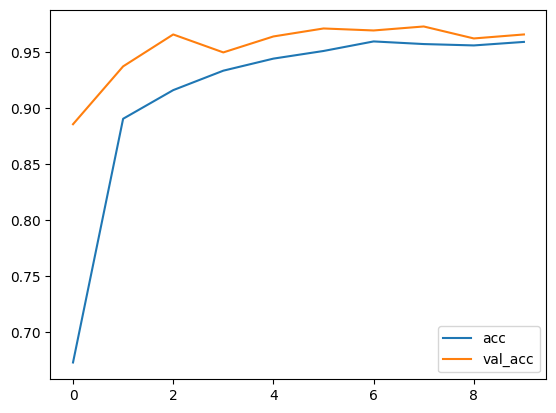

In [ ]:
##Plot des courbes d'entraînement (accuracy)
plt.plot(model_history.history['acc'],label='acc')
plt.plot(model_history.history['val_acc'],label='val_acc')
plt.legend()

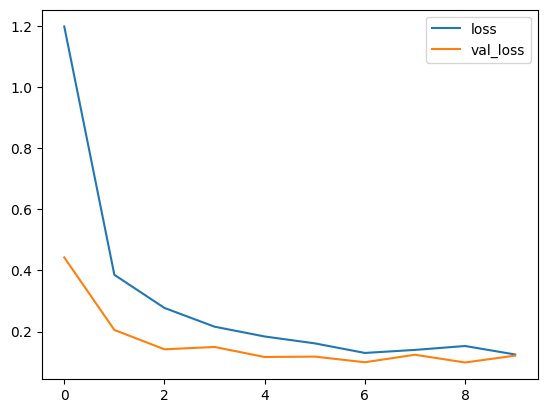

In [ ]:
##Plot des courbes de perte
plt.plot(model_history.history['loss'],label='loss')
plt.plot(model_history.history['val_loss'],label='val_loss')
plt.legend()

In [ ]:
##Prédiction et rapport de classification

y_pred = model.predict(test_gen)
y_pred_classes = np.argmax(y_pred, axis=1)
y_true = test_gen.classes

class_names = list(test_gen.class_indices.keys())
report = classification_report(y_true, y_pred_classes, target_names=class_names)
print(report)


59/59 ━━━━━━━━━━━━━━━━━━━━ 80s 1s/step
                           precision    recall  f1-score   support

                    Apple       0.97      0.99      0.98       317
              Black-grass       0.00      0.00      0.00        31
                Blueberry       0.97      0.99      0.98       150
                 Charlock       0.96      0.96      0.96        45
  Cherry_(including_sour)       0.98      0.97      0.98       191
                 Cleavers       0.97      0.91      0.94        33
         Common Chickweed       0.97      0.85      0.90        72
             Common wheat       0.72      0.72      0.72        25
             Corn_(maize)       0.99      1.00      1.00       386
                  Fat Hen       0.94      0.91      0.92        54
                    Grape       1.00      1.00      1.00       407
         Loose Silky-bent       0.65      0.99      0.78        76
                    Maize       0.85      0.88      0.86        25
                   Ora

/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.cap

## EfficientNet

In [ ]:
##Importation du modèle de base
base_model = EfficientNetB3(include_top= False, weights= "imagenet", input_shape=(224,224,3))

for layer in base_model.layers:
    layer.trainable = False

model_eff = Sequential()
model_eff.add(base_model)
model_eff.add(GlobalAveragePooling2D()) 
model_eff.add(Dense(1024,activation='relu'))
model_eff.add(Dropout(rate=0.2))
model_eff.add(Dense(512, activation='relu'))
model_eff.add(Dropout(rate=0.2))
model_eff.add(Dense(26, activation='softmax'))

#Sommaire
model_eff.summary()

#Compilation
model_eff.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])



Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ efficientnetb3 (Functional)     │ (None, 7, 7, 1536)     │    10,783,535 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d_1      │ (None, 1536)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_3 (Dense)                 │ (None, 1024)           │     1,573,888 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 26)             │        13,338 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 12,895,561 (49.19 MB)

 Trainable params: 2,112,026 (8.06 MB)

 Non-trainable params: 10,783,535 (41.14 MB)

In [ ]:
##Entraînement
history_eff = model_eff.fit(x= train_gen, epochs= 10,
                    validation_data= valid_gen, validation_steps= None, shuffle= False)


Epoch 1/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 583s 613ms/step - accuracy: 0.8433 - loss: 0.5297 - val_accuracy: 0.9695 - val_loss: 0.0864
Epoch 2/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 577s 612ms/step - accuracy: 0.9620 - loss: 0.1180 - val_accuracy: 0.9748 - val_loss: 0.0708
Epoch 3/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 576s 610ms/step - accuracy: 0.9726 - loss: 0.0852 - val_accuracy: 0.9790 - val_loss: 0.0570
Epoch 4/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 576s 610ms/step - accuracy: 0.9784 - loss: 0.0665 - val_accuracy: 0.9777 - val_loss: 0.0659
Epoch 5/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 582s 616ms/step - accuracy: 0.9806 - loss: 0.0562 - val_accuracy: 0.9818 - val_loss: 0.0516
Epoch 6/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 597s 632ms/step - accuracy: 0.9830 - loss: 0.0493 - val_accuracy: 0.9830 - val_loss: 0.0493
Epoch 7/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 588s 623ms/step - accuracy: 0.9858 - loss: 0.0409 - val_accuracy: 0.9845 - val_loss: 0.0482
Epoch 8/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 589s 624ms/step - accuracy: 0.9860 -

In [ ]:
##Sauvegarde du modèle
model_eff.save("eff3.h5") 

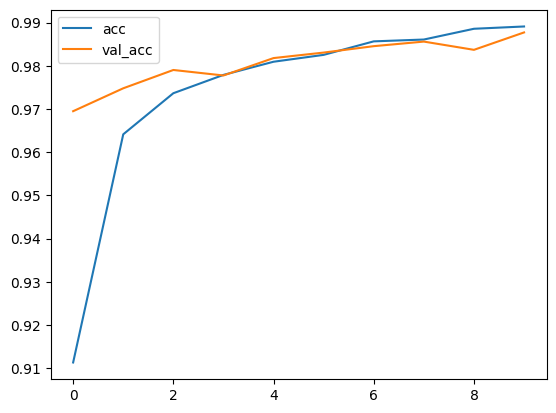

In [ ]:
##Courbe d'entraînement (précision)
plt.plot(history_eff.history['accuracy'],label='acc')
plt.plot(history_eff.history['val_accuracy'],label='val_acc')
plt.legend()

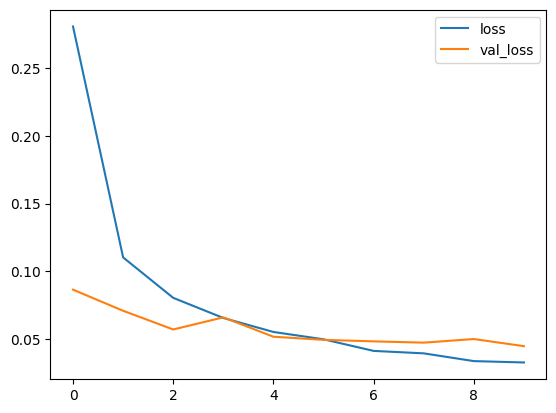

In [ ]:
##Courbe de perte
plt.plot(history_eff.history['loss'],label='loss')
plt.plot(history_eff.history['val_loss'],label='val_loss')
plt.legend()

In [ ]:
##Prédiction et rapport de classification
y_pred_eff = model_eff.predict(test_gen)
y_pred_classes_eff = np.argmax(y_pred_eff, axis=1)
y_true = test_gen.classes


class_names = list(test_gen.class_indices.keys())
report_eff = classification_report(y_true, y_pred_classes_eff, target_names=class_names)
print(report_eff)

59/59 ━━━━━━━━━━━━━━━━━━━━ 69s 1s/step
                           precision    recall  f1-score   support

                    Apple       0.99      0.99      0.99       317
              Black-grass       0.68      0.48      0.57        31
                Blueberry       1.00      1.00      1.00       150
                 Charlock       1.00      0.98      0.99        45
  Cherry_(including_sour)       1.00      1.00      1.00       191
                 Cleavers       0.94      0.97      0.96        33
         Common Chickweed       0.99      0.97      0.98        72
             Common wheat       0.85      0.88      0.86        25
             Corn_(maize)       1.00      1.00      1.00       386
                  Fat Hen       0.96      0.96      0.96        54
                    Grape       1.00      1.00      1.00       407
         Loose Silky-bent       0.81      0.93      0.87        76
                    Maize       1.00      0.88      0.94        25
                   Ora

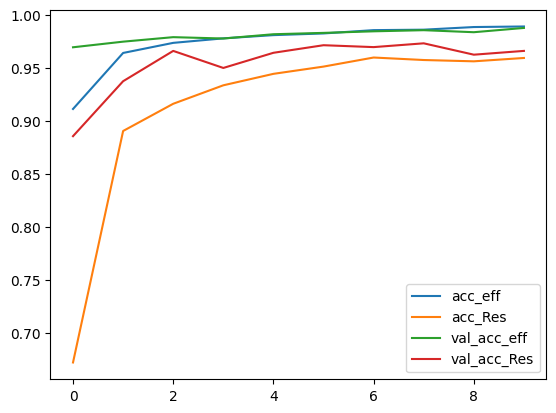

In [ ]:
##Figure de comparaison entre ResNet et EfficientNet
plt.plot(history_eff.history['accuracy'],label='acc_eff')
plt.plot(model_history.history['acc'],label='acc_Res')
plt.plot(history_eff.history['val_accuracy'],label='val_acc_eff')
plt.plot(model_history.history['val_acc'],label='val_acc_Res')
plt.legend()


## MobileNet

In [ ]:
##Importation du modèle de base
base_model = MobileNet(weights='imagenet', include_top=False,input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False

n_class = 26 
model_mn = Sequential()
model_mn.add(base_model)
model_mn.add(GlobalAveragePooling2D()) 
model_mn.add(Dense(1024,activation='relu'))
model_mn.add(Dropout(rate=0.2))
model_mn.add(Dense(512, activation='relu'))
model_mn.add(Dropout(rate=0.2))
model_mn.add(Dense(26, activation='softmax'))

#Sommaire
model_mn.summary()

#Compilation
model_mn.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])


17225924/17225924 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ mobilenet_1.00_224 (Functional) │ (None, 7, 7, 1024)     │     3,228,864 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ global_average_pooling2d        │ (None, 1024)           │             0 │
│ (GlobalAveragePooling2D)        │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 1024)           │     1,049,600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 1024)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 512)            │       524,800 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 512)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 26)             │        13,338 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,816,602 (18.37 MB)

 Trainable params: 1,587,738 (6.06 MB)

 Non-trainable params: 3,228,864 (12.32 MB)

In [ ]:
##Entraînement
history_mn = model_mn.fit(x= train_gen, epochs= 10,
                    validation_data= valid_gen, validation_steps= None, shuffle= False)

Epoch 1/10


/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


944/944 ━━━━━━━━━━━━━━━━━━━━ 178s 188ms/step - accuracy: 0.7100 - loss: 0.9546 - val_accuracy: 0.8803 - val_loss: 0.3579
Epoch 2/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 174s 185ms/step - accuracy: 0.8837 - loss: 0.3435 - val_accuracy: 0.9095 - val_loss: 0.2696
Epoch 3/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 172s 182ms/step - accuracy: 0.9064 - loss: 0.2819 - val_accuracy: 0.9150 - val_loss: 0.2488
Epoch 4/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 173s 183ms/step - accuracy: 0.9173 - loss: 0.2388 - val_accuracy: 0.9277 - val_loss: 0.2176
Epoch 5/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 182s 193ms/step - accuracy: 0.9311 - loss: 0.2024 - val_accuracy: 0.9364 - val_loss: 0.1922
Epoch 6/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 176s 186ms/step - accuracy: 0.9381 - loss: 0.1761 - val_accuracy: 0.9290 - val_loss: 0.2004
Epoch 7/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 174s 184ms/step - accuracy: 0.9446 - loss: 0.1601 - val_accuracy: 0.9326 - val_loss: 0.1878
Epoch 8/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 178s 188ms/step - accuracy: 0.9489 - loss: 0.14

In [ ]:
## Sauvegarde du modèle
model_mn.save("mn.h5") 

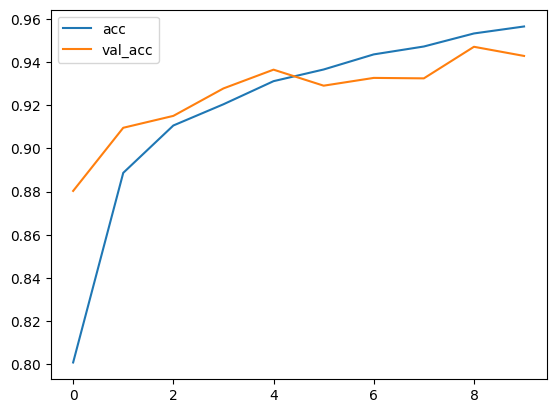

In [ ]:
## Courbe d'entraînement (précision)
plt.plot(history_mn.history['accuracy'],label='acc')
plt.plot(history_mn.history['val_accuracy'],label='val_acc')
plt.legend()

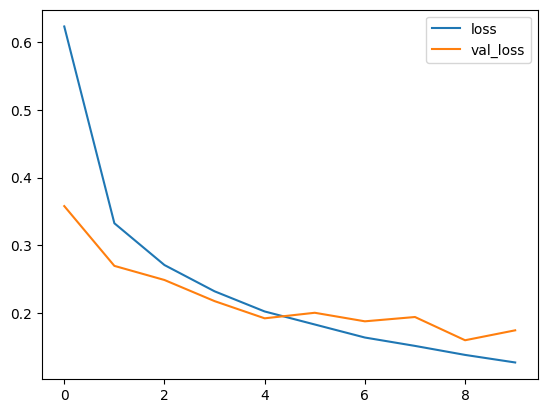

In [ ]:
## Courbe de perte
plt.plot(history_mn.history['loss'],label='loss')
plt.plot(history_mn.history['val_loss'],label='val_loss')
plt.legend()

In [ ]:
## Prédiciton et rapport de classification
y_pred_mn = model_mn.predict(test_gen)
y_pred_classes_mn = np.argmax(y_pred_mn, axis=1)
y_true = test_gen.classes


class_names = list(test_gen.class_indices.keys())
report_mn = classification_report(y_true, y_pred_classes_mn, target_names=class_names)
print(report_mn)

59/59 ━━━━━━━━━━━━━━━━━━━━ 20s 337ms/step
                           precision    recall  f1-score   support

                    Apple       0.87      0.90      0.88       317
              Black-grass       0.53      0.68      0.59        31
                Blueberry       0.94      0.89      0.92       150
                 Charlock       0.93      0.96      0.95        45
  Cherry_(including_sour)       0.97      0.94      0.95       191
                 Cleavers       0.94      0.94      0.94        33
         Common Chickweed       0.96      0.90      0.93        72
             Common wheat       0.94      0.68      0.79        25
             Corn_(maize)       0.99      0.98      0.99       386
                  Fat Hen       0.94      0.91      0.92        54
                    Grape       1.00      0.99      0.99       407
         Loose Silky-bent       0.84      0.78      0.81        76
                    Maize       0.95      0.80      0.87        25
                   

## From scratch (LeNet)

In [ ]:
## Architecture du mocèle 

model_fs = Sequential()
model_fs.add(Conv2D(filters=32, kernel_size=(5, 5), padding='valid', activation='relu',input_shape=(224, 224, 3)))
model_fs.add(MaxPooling2D(pool_size=(2, 2)))
model_fs.add(Conv2D(filters=16, kernel_size=(5, 5), padding='valid', activation='relu',input_shape=(224, 224, 3)))
model_fs.add(MaxPooling2D(pool_size=(2, 2)))
model_fs.add(Dropout(rate=0.2))
model_fs.add(Flatten())
model_fs.add(Dense(units=128, activation='relu'))
model_fs.add(Dense(units=26, activation='softmax'))

##Sommaire
model_fs.summary()

##Compilation
model_fs.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])



/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d_2 (Conv2D)               │ (None, 220, 220, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 110, 110, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_3 (Conv2D)               │ (None, 106, 106, 16)   │        12,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_3 (MaxPooling2D)  │ (None, 53, 53, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 53, 53, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_1 (Flatten)             │ (None, 44944)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 128)            │     5,752,960 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 26)             │         3,354 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,771,562 (22.02 MB)

 Trainable params: 5,771,562 (22.02 MB)

 Non-trainable params: 0 (0.00 B)

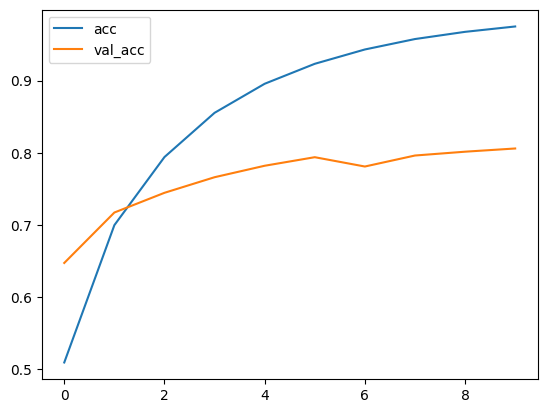

In [ ]:
## Courbe d'entraînement (précision)
plt.plot(history_fs.history['accuracy'],label='acc')
plt.plot(history_fs.history['val_accuracy'],label='val_acc')
plt.legend()

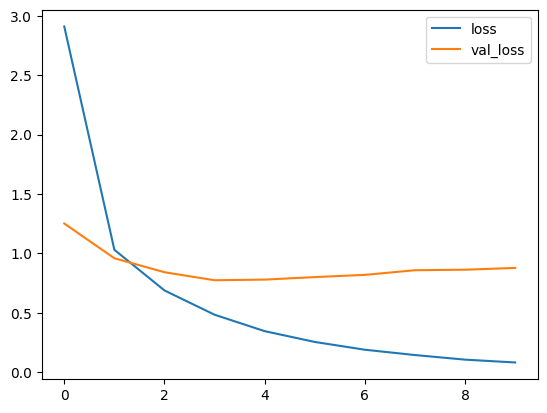

In [ ]:
## Courbe de perte
plt.plot(history_fs.history['loss'],label='loss')
plt.plot(history_fs.history['val_loss'],label='val_loss')
plt.legend()

In [ ]:
##Entraînement
history_fs = model_fs.fit(x= train_gen, epochs= 10,
                    validation_data= valid_gen, validation_steps= None, shuffle= False)

Epoch 1/10


/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/trainers/data_adapters/py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


944/944 ━━━━━━━━━━━━━━━━━━━━ 376s 398ms/step - accuracy: 0.3910 - loss: 9.3429 - val_accuracy: 0.6472 - val_loss: 1.2515
Epoch 2/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 375s 397ms/step - accuracy: 0.6874 - loss: 1.0812 - val_accuracy: 0.7171 - val_loss: 0.9590
Epoch 3/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 374s 396ms/step - accuracy: 0.7944 - loss: 0.6986 - val_accuracy: 0.7444 - val_loss: 0.8414
Epoch 4/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 374s 396ms/step - accuracy: 0.8573 - loss: 0.4783 - val_accuracy: 0.7661 - val_loss: 0.7739
Epoch 5/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 375s 397ms/step - accuracy: 0.8984 - loss: 0.3375 - val_accuracy: 0.7819 - val_loss: 0.7792
Epoch 6/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 373s 395ms/step - accuracy: 0.9253 - loss: 0.2497 - val_accuracy: 0.7938 - val_loss: 0.8004
Epoch 7/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 374s 396ms/step - accuracy: 0.9443 - loss: 0.1818 - val_accuracy: 0.7809 - val_loss: 0.8192
Epoch 8/10
944/944 ━━━━━━━━━━━━━━━━━━━━ 373s 395ms/step - accuracy: 0.9609 - loss: 0.13

In [ ]:
##Sauvegarde
model_fs.save('fs.h5')

In [ ]:
##Prédiction et rapport de classification
y_pred_fs = model_fs.predict(test_gen)
y_pred_classes_fs = np.argmax(y_pred_fs, axis=1)
y_true = test_gen.classes


class_names = list(test_gen.class_indices.keys())
report_fs = classification_report(y_true, y_pred_classes_fs, target_names=class_names)
print(report_fs)

59/59 ━━━━━━━━━━━━━━━━━━━━ 11s 187ms/step
                           precision    recall  f1-score   support

                    Apple       0.72      0.73      0.73       317
              Black-grass       0.18      0.23      0.20        31
                Blueberry       0.89      0.87      0.88       150
                 Charlock       0.76      0.69      0.72        45
  Cherry_(including_sour)       0.81      0.87      0.84       191
                 Cleavers       0.55      0.36      0.44        33
         Common Chickweed       0.62      0.72      0.67        72
             Common wheat       0.12      0.04      0.06        25
             Corn_(maize)       0.87      0.94      0.90       386
                  Fat Hen       0.46      0.44      0.45        54
                    Grape       0.95      0.96      0.95       407
         Loose Silky-bent       0.55      0.64      0.59        76
                    Maize       0.67      0.32      0.43        25
                   

## Étape 4 : Interprétation des résultats avec Grad-Cam

On utilise pour cela la documentation et les exemples fournis par Keras. La fonction `get_img_array`et `make_gradcam_heatmap`proviennent de cette documentation.  

Néanmoins pour faire fonctionner grad-cam, il faut utiliser la fonction `Model()`et non `Sequential()` ce qui nous a obligé à revoir la façon de coder nos modèles pour pouvoir les interpréter avec Grad-Cam (Gradient-weighted Class Activation Mapping).  

Cette partie consiste à appliquer une Grad-Cam, c'est à dire une technique de visualisation utilisée en deep learning pour comprendre quelle partie de l'image a influencé les décisions du CNN.  
La méthode produit une heatmap qui met en évidence les régions considérées importantes par le modèle. 

### Fonctions pour le Grad-Cam

#### Fonctions importées de Keras

In [ ]:
import tensorflow as tf

##Importation de l'image
def get_img_array(img_path, size):
    """
    Importation d'une image dans les normes du gradcam
    Paramètres : 
        img_path (string) : chemin de l'image 
        size (tuple) : taille de l'image
    Return : 
        array (array): image 
    """
    img = tf.keras.preprocessing.image.load_img(img_path, target_size=size)
    array = tf.keras.preprocessing.image.img_to_array(img)
    array = np.expand_dims(array, axis=0)
    return array

##Heatmap pour le gradcam
def make_gradcam_heatmap(img_array, model, last_conv_layer_name, pred_index=None):
    """
    Génération de la heatmap du gradcam à partir d'un modèle 
    Paramètres : 
        img_array (array) : image
        model (keras.models) : modèle (sous forme de Model())
        last_conv_layer_name (string) : nom de la dernière couche de convolution du modèle
        pred_index : indice de prédiction
    Return : 
        heatmap (array): heatmap du gradcam 
    """
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(last_conv_layer_name).output, model.output]
    )
    
    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(img_array)
        if pred_index is None:
            pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]
    
    grads = tape.gradient(class_channel, last_conv_layer_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))
    
    last_conv_layer_output = last_conv_layer_output[0]
    heatmap = last_conv_layer_output @ pooled_grads[..., tf.newaxis]
    heatmap = tf.squeeze(heatmap)
    
    heatmap = tf.maximum(heatmap, 0) / tf.math.reduce_max(heatmap)
    return heatmap.numpy()


#### Fonctions crées pour le Grad-Cam

In [ ]:
## Fonction pour créer un modèle de Transfer-Learning avec la fonction Model() et les couches utilisées Sequential()
def make_model_for_gradcam(base_model,output_file_name,train_gen=train_gen,valid_gen=valid_gen,verbose=0):
    """
    Génération d'un modèle avec les normes grad cam et pour un modèle de base au choix
    Paramètres : 
        base_model (keras.models) : modèle de base
        output_file_name (string) : chemin d'exporation du modèle
        train_gen (ImageDataGenerator) : Generateur d'image d'entrainement
        valid_gen (ImageDataGenerator): Generateur d'image de validation
        verbose (int) : 0 (défaut) non affichage du summary -- 1 - affichage du summary 
    Return : 
        model (keras.model): modèle entraîné au norme du gradcam
    """
    x = GlobalAveragePooling2D()(base_model.output)
    x = Dense(1024, activation='relu')(x)
    x = Dropout(rate=0.2)(x)
    x = Dense(512, activation='relu')(x)
    x = Dropout(rate=0.2)(x)
    output = Dense(26, activation='softmax')(x)

    model = Model(inputs=base_model.input, outputs=output)

    if verbose == 1 : 
        model.summary()

    model.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

    model_history = model.fit(train_gen,validation_data=valid_gen,
    epochs=10,steps_per_epoch=train_gen.samples // 320,
    validation_steps=valid_gen.samples // 320,
    )
    model.save(output_file_name)

    return model
    
## Trouver le nom de la dernière couche de convolution du modèle
def find_last_conv_layer(model):
    """
    Trouver le nom de la dernière couche de convolution du modèle
    Paramètres : 
        model (keras.models) : modèle
    Return : 
        last_conv_layer.name : nom de la dernière couche de convolution du modèle
    """
    last_conv_layer = None

    for layer in reversed(model.layers):

        if type(layer) == Conv2D:
            last_conv_layer = layer
            return last_conv_layer.name

    if last_conv_layer == None:
        raise ValueError("Pas de Conv2D dans le modèle")
    return 0
    
## Prédictions pour une image avec classe + précision 
def predictions(preds, class_names):
    """
    Prédiction de la classe avec sa précision d'une image
    Paramètres : 
        preds (list) : prediction du modèle
        class_names (list) : classes
    Return : 
        class_name (string): nom de la classe prédite avec le maximum de probabilité
        precision (float) : pourcentage de précision
    """
    top_pred = np.argmax(preds[0])
    class_name = class_names[top_pred]
    precision = preds[0][top_pred]
    return [(class_name, precision)]

## Affichage du gradcam pour une image et un seul modèle
def display_gradcam_single(output_name,class_img,precision,true_species):
    """
    Affichage du gradcam appliqué à une image pour un seul modèle
    Paramètres : 
        output_name (string) : nom du fichier de sortie de l'image
        class_img (string) : nom de la classe prédite de l'image
        precision (float) : pourcentage de probabilité de la classe prédite
        true_species (string): vraie espèce de la plante
    """
    img_sur = plt.imread(output_name)
    plt.imshow(img_sur)
    plt.colorbar()
    if true_species == None :
        plt.title(f"Prédiction : {class_img} - {precision*100:.2f}%")
    else :
        plt.title(f"Prédiction : {class_img} - {precision*100:.2f}% - Vraie espèce : {true_species}")
    plt.axis('off')

## Application du gradcam pour une image
def apply_gradcam_single(img_path,model,output_name,true_species=None,train_gen=train_gen,display=True):
    """
    Application du gradcam pour une image pour un seul modèle
    Paramètres : 
        img_path (chemin) : chemin de l'image à traiter
        model (keras.models) : modèle pour le gradcam
        output_name (string) : chemin de sortie de l'image appliquée au gradcam
        true_species (string) : Défaut : None - Vraie espèce de la plante
        train_gen (ImageDataGenerator) : Generateur d'image d'entrainement
        valid_gen (ImageDataGenerator) : Generateur d'image de validation
        display (Bool) : True (Défaut) : Affichage de l'image gradcam - False : Non affichage de l'image gradcam

    Return : 
        class_img (string): nom de la classe prédite avec le maximum de probabilité
        precision (float) : pourcentage de précision
    """
    img_array = get_img_array(img_path, size=(224, 224))
    last_conv_layer_name = find_last_conv_layer(model)
    heatmap = make_gradcam_heatmap(img_array, model, last_conv_layer_name)

    img = cv2.imread(img_path)
    heatmap = cv2.resize(heatmap, (img.shape[1], img.shape[0]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    superimposed_img = heatmap * 0.5 + img
    cv2.imwrite(output_name, superimposed_img)

    preds = model.predict(img_array)
    class_dict = train_gen.class_indices
    class_names = list(class_dict.keys())   
    class_img, precision = predictions(preds, class_names)[0]
    if display==True:
        display_gradcam_single(output_name,class_img,precision,true_species)
    return class_img,precision


### Exemple avec ResNet

On commence par générer et entraîner le modèle pour le GradCam

In [39]:
base_model = ResNet50(weights='imagenet', include_top=False,input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False

model_resnet = make_model_for_gradcam(base_model,'resnet_model.h5',train_gen,valid_gen,verbose=1)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer_3       │ (None, 224, 224,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_pad           │ (None, 230, 230,  │          0 │ input_layer_3[0]… │
│ (ZeroPadding2D)     │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_conv (Conv2D) │ (None, 112, 112,  │      9,472 │ conv1_pad[0][0]   │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_bn            │ (None, 112, 112,  │        256 │ conv1_conv[0][0]  │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv1_relu          │ (None, 112, 112,  │          0 │ conv1_bn[0][0]    │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pad           │ (None, 114, 114,  │          0 │ conv1_relu[0][0]  │
│ (ZeroPadding2D)     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ pool1_pool          │ (None, 56, 56,    │          0 │ pool1_pad[0][0]   │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_conv │ (None, 56, 56,    │      4,160 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_bn   │ (None, 56, 56,    │        256 │ conv2_block1_1_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_1_relu │ (None, 56, 56,    │          0 │ conv2_block1_1_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_conv │ (None, 56, 56,    │     36,928 │ conv2_block1_1_r… │
│ (Conv2D)            │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_bn   │ (None, 56, 56,    │        256 │ conv2_block1_2_c… │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_2_relu │ (None, 56, 56,    │          0 │ conv2_block1_2_b… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_conv │ (None, 56, 56,    │     16,640 │ pool1_pool[0][0]  │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_conv │ (None, 56, 56,    │     16,640 │ conv2_block1_2_r… │
│ (Conv2D)            │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_0_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_0_c… │
│ (BatchNormalizatio… │ 256)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2_block1_3_bn   │ (None, 56, 56,    │      1,024 │ conv2_block1_3_c

 Total params: 26,224,026 (100.04 MB)

 Trainable params: 2,636,314 (10.06 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

Epoch 1/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 96s 807ms/step - accuracy: 0.6434 - loss: 1.3321 - val_accuracy: 0.9089 - val_loss: 0.2726
Epoch 2/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 93s 792ms/step - accuracy: 0.9127 - loss: 0.2826 - val_accuracy: 0.9214 - val_loss: 0.2695
Epoch 3/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 92s 784ms/step - accuracy: 0.9227 - loss: 0.2493 - val_accuracy: 0.9661 - val_loss: 0.1230
Epoch 4/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 93s 797ms/step - accuracy: 0.9531 - loss: 0.1584 - val_accuracy: 0.9571 - val_loss: 0.1286
Epoch 5/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 93s 792ms/step - accuracy: 0.9439 - loss: 0.1608 - val_accuracy: 0.9375 - val_loss: 0.1466
Epoch 6/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 92s 788ms/step - accuracy: 0.9544 - loss: 0.1409 - val_accuracy: 0.9482 - val_loss: 0.1322
Epoch 7/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 92s 787ms/step - accuracy: 0.9570 - loss: 0.1223 - val_accuracy: 0.9768 - val_loss: 0.0937
Epoch 8/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 90s 766ms/step - accuracy: 0.9557 - loss: 0

/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


117/117 ━━━━━━━━━━━━━━━━━━━━ 16s 131ms/step - accuracy: 0.9396 - loss: 0.1590 - val_accuracy: 0.9625 - val_loss: 0.0946
Epoch 10/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 87s 740ms/step - accuracy: 0.9691 - loss: 0.0936 - val_accuracy: 0.9696 - val_loss: 0.0866


Avec la fonction `Model()`, ResNet est décomposé en toutes ses couches (contre une seule compressée pour `Sequential()`). 
On a alors accès à la dernière couche de convolution du modèle, nécessaire au bon fonctionnement de Grad-Cam. 
Le type des outputs du modèle diffère aussi par rapport au `Sequential()` (En essayant le Grad-Cam sur le CNN from scratch il y avait également une erreur en utilisant le `Sequential()`).  

Nous pouvons alors maintenant créer une Grad-cam sur une image de l'échantillon de test. Nous y ajoutons également la classe prédite par le modèle avec sa précision :

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step


('Apple', np.float32(0.99935645))

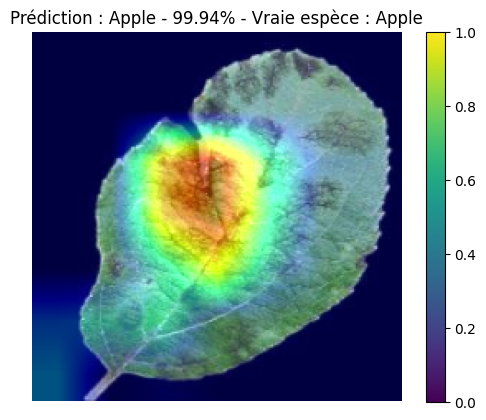

In [ ]:
##conversion des chemins du dataframe de test en liste
img_paths_test = test_df['chemin'].tolist()
img_espece_test = test_df['espèce'].tolist()

##Création d'un dossier pour stocker les images gradcam
(project_dir / 'gradcam_output').mkdir(parents=True, exist_ok=True)

##chemin de sauvegarde de l'image exemple
grad_cam_dir = project_dir / 'gradcam_output'
output_name_gradcam_img = grad_cam_dir / 'exemple_gradcam_Resnet_2.png'

apply_gradcam_single(img_paths_test[3],model_resnet,output_name_gradcam_img,true_species = img_espece_test[3])

### Comparaison avec plusieurs modèles

In [ ]:
##Affichage pour une image et plusieurs modèles
def display_gradcam_multiple(output_names,class_imges,precisions,model_names,true_species,output_name_recap_file):
    """
    Affichage du gradcam appliqué à une image pour plusieurs modèles
    Paramètres : 
        output_names (list) : liste de noms du fichier de sortie de l'image
        class_imges (list) : liste de noms de la classe prédite de l'image
        precisions (list) : liste de pourcentage de probabilité de la classe prédite
        true_species (string): nom de la vraie espèce des plantes
        output_name_recap_file (string) : chemin de sortie de la figure récapitulative 
    """
    n_cols = len(output_names)
    fig, axs = plt.subplots(1, n_cols, figsize=(20, 5))
    if true_species == None : 
        fig.suptitle("Grad-cam comparaison modèles", fontsize=16)
    else : 
        fig.suptitle("Grad-cam comparaison modèles - Vraie espèce : "+str(true_species), fontsize=16)
    axs = axs.flatten()

    for i, img_name in enumerate(output_names):
        img = plt.imread(img_name)
        image = axs[i].imshow(img,cmap='jet')
        axs[i].set_title(f"{model_names[i]} prédiction : {class_imges[i]} - {precisions[i]*100:.2f}%")
        axs[i].axis('off')
        plt.colorbar(image,ax=axs[i],shrink=0.95)
    #fig.colorbar(img, ax=axs)

    fig.tight_layout()
    fig.savefig(output_name_recap_file)
            

## Application du gradcam pour plusieurs modèles
def apply_gradcam_model_comparison(img_path,models,output_names,model_names,output_name_file,train_gen=train_gen,true_species=None,display=False):
    """
    Application du gradcam pour une image pour plusieurs modèles
    Paramètres : 
        img_path (chemin) : chemin de l'image à traiter
        models (list) : liste de modèles pour le gradcam
        output_names (list) : liste de chemin de sortie de l'image appliquée au gradcam pour different modèles
        true_species (string) : Défaut : None - Nom de la vraie espèce de la plante
        train_gen (ImageDataGenerator) : Generateur d'image d'entrainement
        valid_gen (ImageDataGenerator) : Generateur d'image de validation
        display (Bool) : True : Affichage de l'image gradcam - False (Défaut) : Non affichage de l'image gradcam pour tous les modèles

    """
    classes = []
    precisions = []
    for i in range(len(models)) :
        class_img, precision = apply_gradcam_single(img_path,models[i],output_names[i],train_gen=train_gen,display)
        classes.append(class_img)
        precisions.append(precision)
    display_gradcam_multiple(output_names,classes,precisions,model_names,true_species,output_name_file)


#### EfficientNet

In [ ]:
### On créer une liste de modèle auquel on ajoute déjà ResNet précèdemment calculé : 
model_list = [model_resnet]

###EfficientNet
base_model = EfficientNetB3(weights='imagenet', include_top=False,input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False
model_eff = make_model_for_gradcam(base_model,'efficientnet_model.h5',train_gen,valid_gen)
model_list.append(model_eff)

Epoch 1/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 85s 686ms/step - accuracy: 0.6209 - loss: 1.3596 - val_accuracy: 0.9232 - val_loss: 0.2855
Epoch 2/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 80s 683ms/step - accuracy: 0.8809 - loss: 0.3586 - val_accuracy: 0.9500 - val_loss: 0.1711
Epoch 3/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 79s 674ms/step - accuracy: 0.9216 - loss: 0.2401 - val_accuracy: 0.9554 - val_loss: 0.1406
Epoch 4/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 78s 670ms/step - accuracy: 0.9281 - loss: 0.2276 - val_accuracy: 0.9518 - val_loss: 0.1507
Epoch 5/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 75s 642ms/step - accuracy: 0.9441 - loss: 0.1838 - val_accuracy: 0.9643 - val_loss: 0.1158
Epoch 6/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 76s 651ms/step - accuracy: 0.9533 - loss: 0.1503 - val_accuracy: 0.9571 - val_loss: 0.1072
Epoch 7/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 79s 673ms/step - accuracy: 0.9531 - loss: 0.1600 - val_accuracy: 0.9661 - val_loss: 0.1063
Epoch 8/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 79s 672ms/step - accuracy: 0.9521 - loss: 0

/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


117/117 ━━━━━━━━━━━━━━━━━━━━ 14s 112ms/step - accuracy: 0.9597 - loss: 0.1118 - val_accuracy: 0.9625 - val_loss: 0.1046
Epoch 10/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 78s 665ms/step - accuracy: 0.9529 - loss: 0.1439 - val_accuracy: 0.9804 - val_loss: 0.0804


#### MobileNet

In [60]:
###MobileNet
base_model = MobileNet(weights='imagenet', include_top=False,input_shape=(224, 224, 3))
for layer in base_model.layers:
    layer.trainable = False
model_mobilenet = make_model_for_gradcam(base_model,'mobilenet_model.h5',train_gen,valid_gen)
model_list.append(model_mobilenet)

Epoch 1/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 26s 215ms/step - accuracy: 0.4961 - loss: 1.7958 - val_accuracy: 0.7304 - val_loss: 0.8099
Epoch 2/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 23s 197ms/step - accuracy: 0.7533 - loss: 0.7816 - val_accuracy: 0.8464 - val_loss: 0.5210
Epoch 3/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 23s 196ms/step - accuracy: 0.8056 - loss: 0.5878 - val_accuracy: 0.8286 - val_loss: 0.4340
Epoch 4/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 22s 189ms/step - accuracy: 0.8146 - loss: 0.5833 - val_accuracy: 0.8821 - val_loss: 0.3967
Epoch 5/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 23s 198ms/step - accuracy: 0.8408 - loss: 0.4673 - val_accuracy: 0.8750 - val_loss: 0.3769
Epoch 6/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 23s 197ms/step - accuracy: 0.8581 - loss: 0.4297 - val_accuracy: 0.8875 - val_loss: 0.3269
Epoch 7/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 22s 187ms/step - accuracy: 0.8624 - loss: 0.3966 - val_accuracy: 0.9179 - val_loss: 0.2711
Epoch 8/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 22s 186ms/step - accuracy: 0.8705 - loss: 0

/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


117/117 ━━━━━━━━━━━━━━━━━━━━ 4s 31ms/step - accuracy: 0.8849 - loss: 0.3645 - val_accuracy: 0.8750 - val_loss: 0.3644
Epoch 10/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 22s 187ms/step - accuracy: 0.8762 - loss: 0.3560 - val_accuracy: 0.8875 - val_loss: 0.3226


#### CNN LeNet

In [ ]:
###LeNet
inputs = Input(shape=(224, 224, 3))
x = Conv2D(32, kernel_size=(5, 5), padding='valid', activation='relu',input_shape=(224, 224, 3))(inputs)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Conv2D(filters=16, kernel_size=(5, 5), padding='valid', activation='relu',input_shape=(224, 224, 3))(x)
x = MaxPooling2D(pool_size=(2, 2))(x)
x = Dropout(rate=0.2)(x)
x = Flatten()(x)
x = Dense(units=128, activation='relu')(x)
outputs = Dense(units=26, activation='softmax')(x)

model_lenet = Model(inputs=inputs, outputs=outputs)

#Sommaire
model_lenet.summary()

#Compilation
model_lenet.compile(Adamax(learning_rate= 0.001), loss= 'categorical_crossentropy', metrics= ['accuracy'])

#Entraînement
model_lenet_history = model_lenet.fit(train_gen,validation_data=valid_gen,
epochs=10,steps_per_epoch=train_gen.samples // 320,
validation_steps=valid_gen.samples // 320,
)

#Sauvegarde
model_lenet.save('lenet_model.h5')

#ajout dans la liste
model_list.append(model_lenet)



/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "functional_16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ input_layer_8 (InputLayer)      │ (None, 224, 224, 3)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_4 (Conv2D)               │ (None, 220, 220, 32)   │         2,432 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_4 (MaxPooling2D)  │ (None, 110, 110, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_5 (Conv2D)               │ (None, 106, 106, 16)   │        12,816 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_5 (MaxPooling2D)  │ (None, 53, 53, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_12 (Dropout)            │ (None, 53, 53, 16)     │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten_2 (Flatten)             │ (None, 44944)          │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_19 (Dense)                │ (None, 128)            │     5,752,960 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 26)             │         3,354 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 5,771,562 (22.02 MB)

 Trainable params: 5,771,562 (22.02 MB)

 Non-trainable params: 0 (0.00 B)

Epoch 1/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 51s 431ms/step - accuracy: 0.1900 - loss: 32.7976 - val_accuracy: 0.3804 - val_loss: 2.2091
Epoch 2/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 49s 415ms/step - accuracy: 0.4180 - loss: 2.0256 - val_accuracy: 0.5661 - val_loss: 1.6604
Epoch 3/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 49s 417ms/step - accuracy: 0.5298 - loss: 1.6709 - val_accuracy: 0.5625 - val_loss: 1.5394
Epoch 4/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 48s 413ms/step - accuracy: 0.5752 - loss: 1.5057 - val_accuracy: 0.6054 - val_loss: 1.4907
Epoch 5/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 49s 419ms/step - accuracy: 0.6159 - loss: 1.4076 - val_accuracy: 0.6196 - val_loss: 1.3138
Epoch 6/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 48s 412ms/step - accuracy: 0.6447 - loss: 1.2534 - val_accuracy: 0.6268 - val_loss: 1.2981
Epoch 7/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 48s 414ms/step - accuracy: 0.6626 - loss: 1.2353 - val_accuracy: 0.6500 - val_loss: 1.2536
Epoch 8/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 48s 411ms/step - accuracy: 0.6866 - loss: 

/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/trainers/epoch_iterator.py:107: UserWarning: Your input ran out of data; interrupting training. Make sure that your dataset or generator can generate at least `steps_per_epoch * epochs` batches. You may need to use the `.repeat()` function when building your dataset.
  self._interrupted_warning()


117/117 ━━━━━━━━━━━━━━━━━━━━ 5s 38ms/step - accuracy: 0.6918 - loss: 1.1191 - val_accuracy: 0.6964 - val_loss: 1.1301
Epoch 10/10
117/117 ━━━━━━━━━━━━━━━━━━━━ 48s 413ms/step - accuracy: 0.7031 - loss: 1.0269 - val_accuracy: 0.6179 - val_loss: 1.3382


#### Grad-Cam de 10 images aléatoires dans l'échantillon de test

/var/folders/gj/rdh3nn8n14qd215cfjv0x6kc0000gn/T/ipykernel_65211/1013627535.py:1: DeprecationWarning: This function is deprecated. Please call randint(0, 4720 + 1) instead
  random_img = np.random.random_integers(low=0,high=len(img_paths_test),size=10)
/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_537']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step


/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_718']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step


/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_1109']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)
/Users/clara/opt/anaconda3/envs/plant/lib/python3.9/site-packages/keras/src/models/functional.py:238: UserWarning: The structure of `inputs` doesn't match the expected structure.
Expected: [['keras_tensor_1205']]
Received: inputs=Tensor(shape=(1, 224, 224, 3))
  warnings.warn(msg)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 21ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 27ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 26ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━

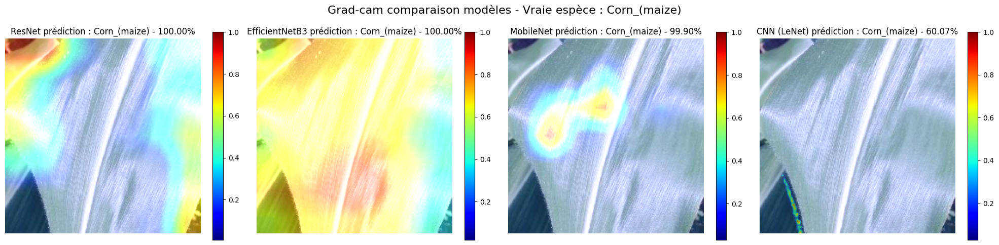

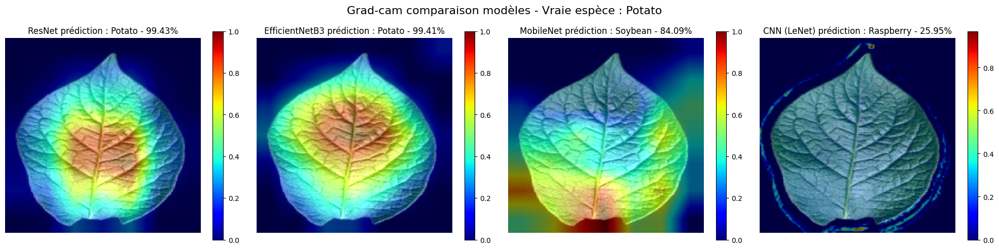

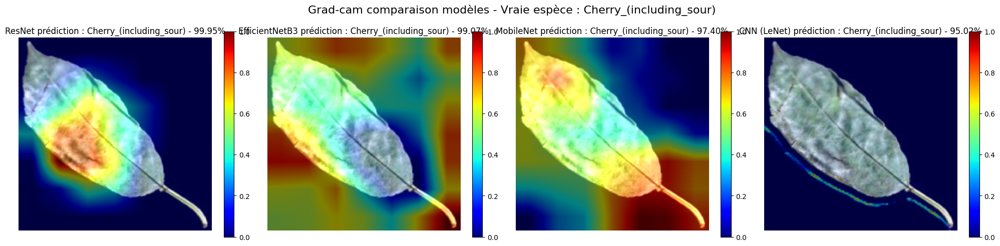

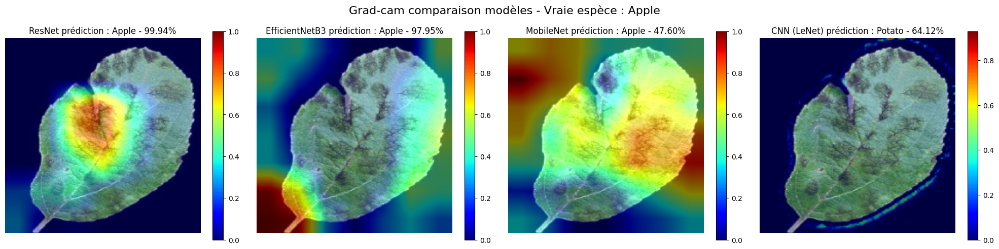

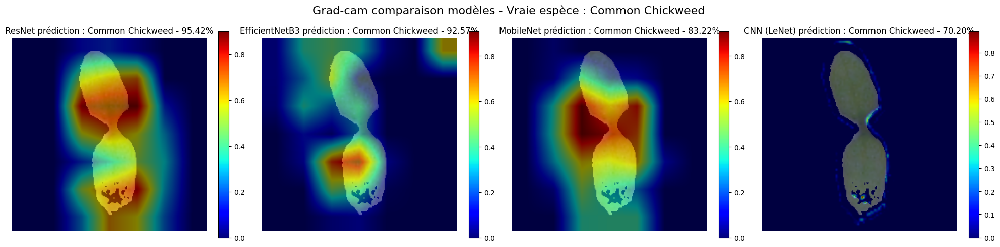

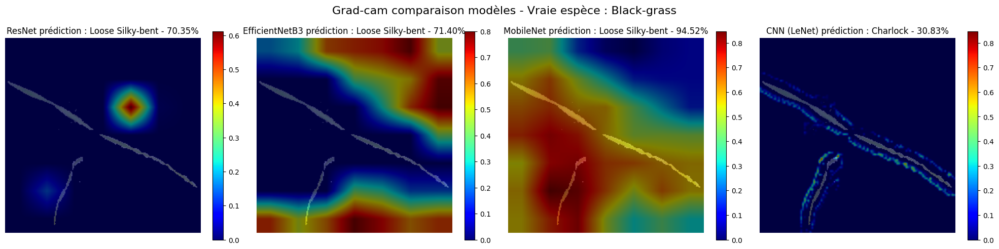

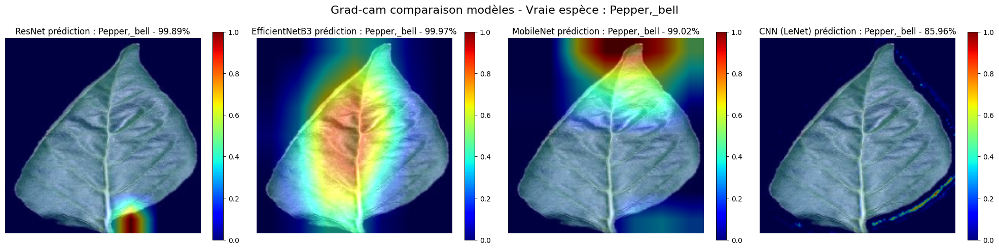

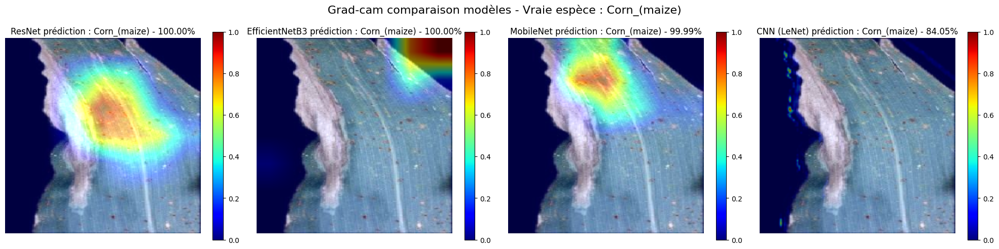

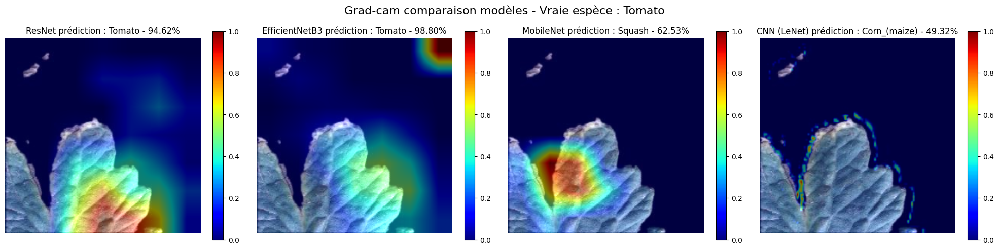

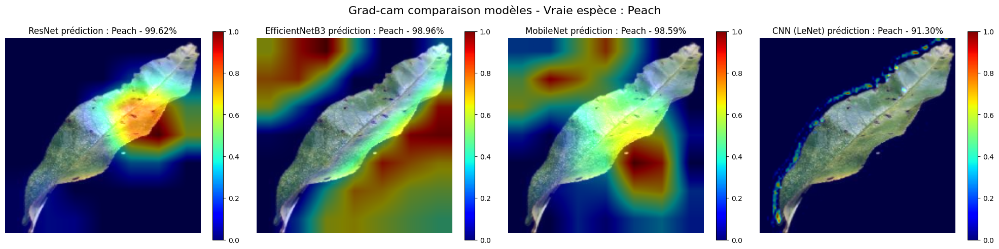

In [ ]:
##Application du gradcam pour 10 images tirées aléatoirement dans l'échantillon test
random_img = np.random.random_integers(low=0,high=len(img_paths_test),size=10)
for i in range(len(random_img)):
    output_names = [grad_cam_dir / f'Resnet_{i}.png', grad_cam_dir / f'Efficientet_{i}.png', grad_cam_dir / f'Mobilenet{i}.png', grad_cam_dir / f'Lenet{i}.png']
    apply_gradcam_model_comparison(img_paths_test[i],model_list,output_names,model_names=['ResNet','EfficientNetB3','MobileNet','CNN (LeNet)'],train_gen=train_gen,true_species=img_espece_test[i],output_name_file=grad_cam_dir / f'model_comparison_{i}.png')